## 1. Imports

Chargement des bibliothèques nécessaires : **OpenCV** pour le traitement d'images, **NumPy** pour les calculs matriciels, et **Matplotlib** pour la visualisation.

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

## 2. Prétraitement — Pipeline principal

Définition de la fonction `pretraitement_image_pipeline()` qui applique dans l'ordre :
1. Lecture de l'image
2. Conversion BGR → RGB
3. Redimensionnement à 256×256 px
4. Flou Gaussien (noyau 5×5)
5. Conversion en Grayscale et en HSV (depuis l'image filtrée)

In [2]:
def pretraitement_image_pipeline(image_path, display=False):
    img = cv2.imread(image_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # 2. Redimensionnement
    img_resized = cv2.resize(img_rgb, (256, 256))
    
    # 3. Filtrage Gaussien en PREMIER sur l'image de base
    img_blurred = cv2.GaussianBlur(img_resized, (5, 5), 0)
    
    # 4. Conversions dérivées de l'image filtrée
    img_gray = cv2.cvtColor(img_blurred, cv2.COLOR_RGB2GRAY)
    img_hsv = cv2.cvtColor(img_blurred, cv2.COLOR_RGB2HSV)
    
    # --- Affichage des résultats pour le rapport [cite: 32, 33] ---
    if display:
        plt.figure(figsize=(15, 10))
        
        plt.subplot(231), plt.imshow(img_resized), plt.title('Originale (Redimensionnée)')
        plt.subplot(232), plt.imshow(img_gray, cmap='gray'), plt.title('Grayscale')
        plt.subplot(233), plt.imshow(img_hsv), plt.title('Espace HSV')
    if display:
        plt.subplot(234), plt.imshow(img_blurred), plt.title('Filtre Gaussien (Lissé)')
    
    # 6. Analyse de l'histogramme [cite: 30]
    if display:
        plt.subplot(2, 3, (5, 6))
        colors = ('r', 'g', 'b')
        for i, col in enumerate(colors):
            hist = cv2.calcHist([img_resized], [i], None, [256], [0, 256])
            plt.plot(hist, color=col)
            plt.xlim([0, 256])
        plt.title('Histogramme des couleurs RGB')
    
    plt.tight_layout()
    plt.show() 
    return img_resized, img_gray, img_hsv, img_blurred

### Test du prétraitement sur le dataset

Test de la fonction de prétraitement sur 4 classes du dataset PlantVillage. Affiche les résultats visuels pour chaque classe sélectionnée.

Test sur la classe : Tomato_Early_blight


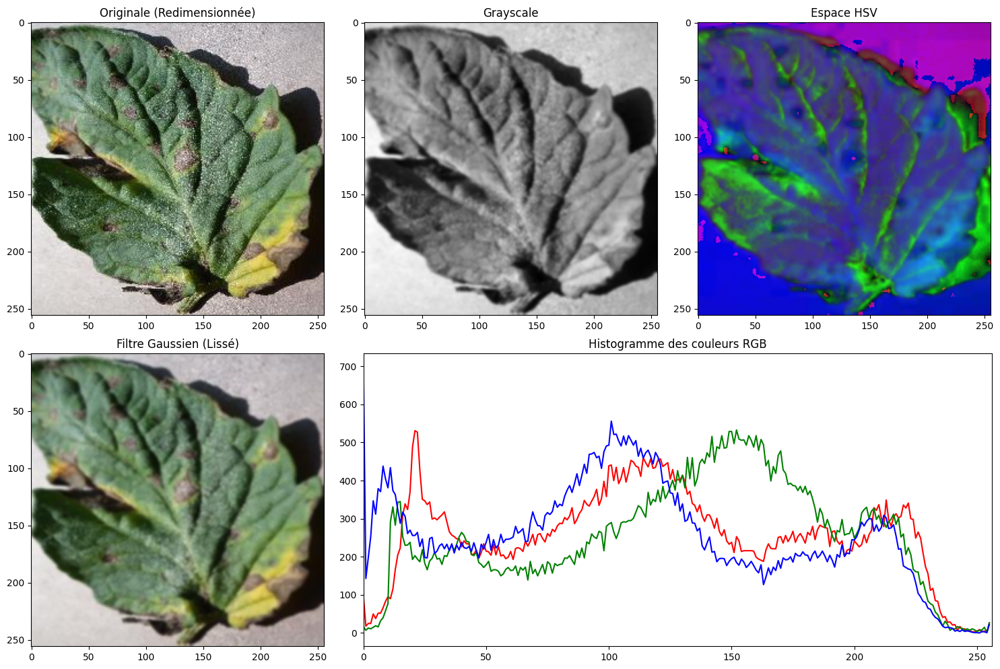

Test sur la classe : Tomato_healthy


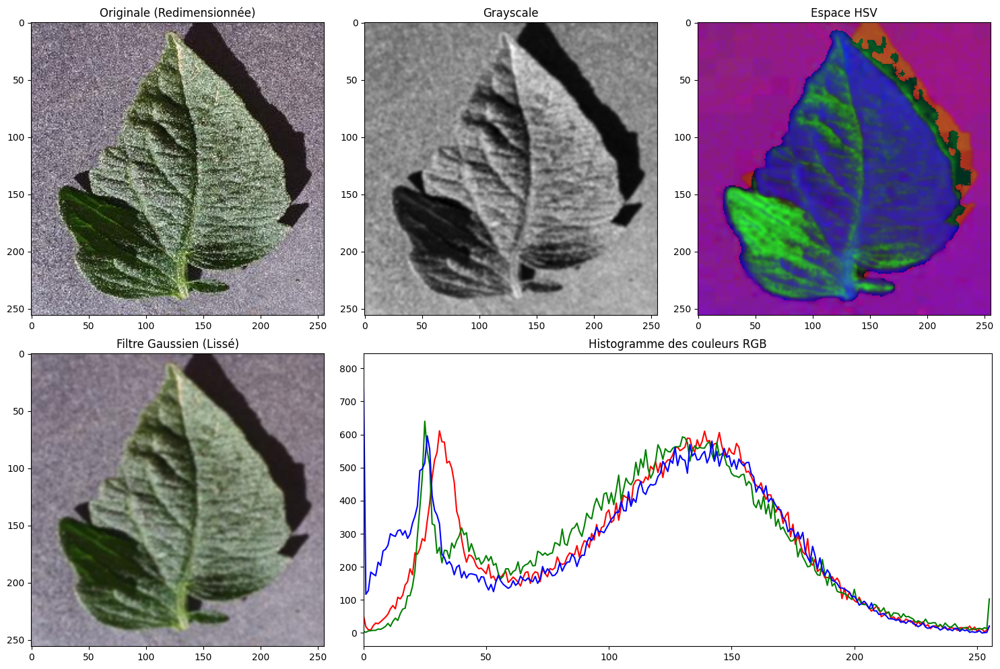

Test sur la classe : Tomato_Late_blight


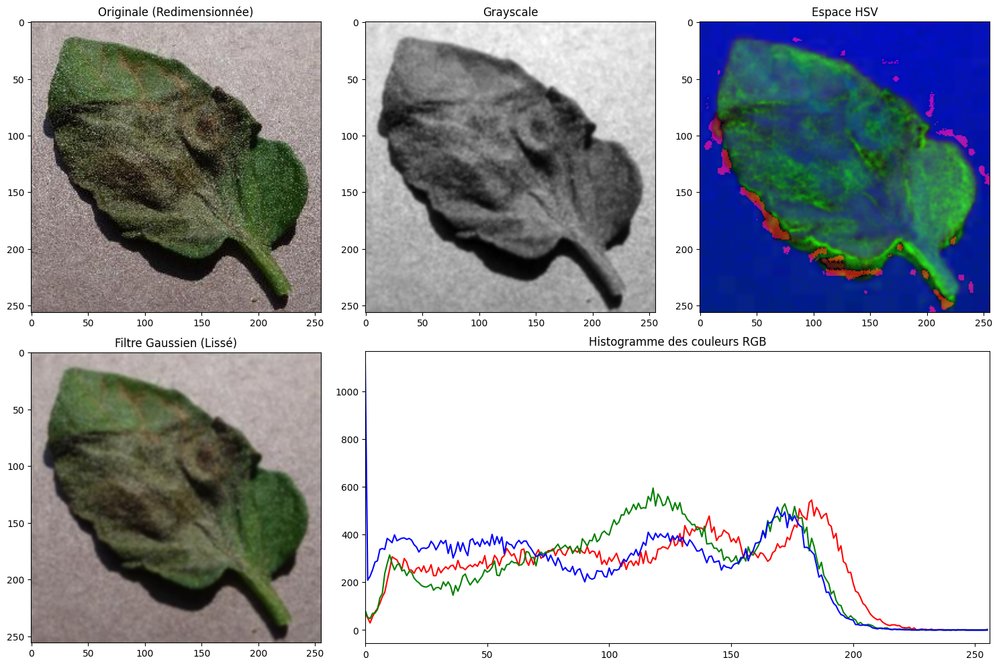

Test sur la classe : Tomato_Leaf_Mold


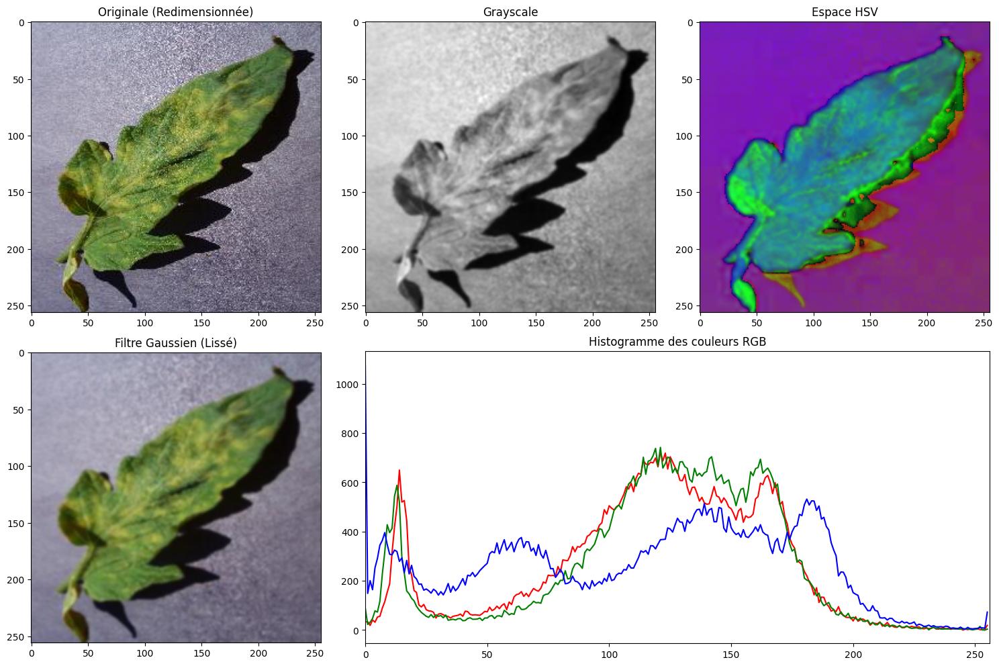

In [3]:
import matplotlib.pyplot as plt

# Définissez le chemin vers votre dossier de données extrait
DATASET_PATH = './data/PlantVillage'  # Mettez à jour ce chemin selon votre structure de dossiers

# 1. Sélectionner vos classes (exemple pour un travail individuel) [cite: 13]
# Remplacez ces noms par les dossiers réels présents dans votre dataset
classes_choisies = os.listdir(DATASET_PATH)[7:11]  # Par exemple, prendre les classes de l'index 7 à la fin (ajustez selon vos besoins)


def tester_pretraitement_sur_dataset(base_path, categories):
    for cat in categories:
        cat_path = os.path.join(base_path, cat)
        # Prendre la première image du dossier de la classe
        img_name = os.listdir(cat_path)[2]
        full_path = os.path.join(cat_path, img_name)
        
        print(f"Test sur la classe : {cat}")
        
        # Appel de la fonction définie précédemment
        # (Assurez-vous que la fonction pretraitement_image est dans le même notebook)
        pretraitement_image_pipeline(full_path, display=True)

# Lancer le test
tester_pretraitement_sur_dataset(DATASET_PATH, classes_choisies)

## 3. Segmentation — Méthode 1 : Seuillage Otsu

Sépare la feuille de l'arrière-plan en trouvant automatiquement le seuil optimal de binarisation.

> `THRESH_BINARY_INV` est utilisé car le fond de PlantVillage est généralement plus clair que la feuille.

In [4]:
def segment_with_otsu(img_blurred, img_gray):
    """
    Applies Otsu's thresholding to create a binary mask and isolate the leaf.
    
    Args:
        img_blurred: The RGB image after Gaussian blur.
        img_gray: The grayscale version of the image.
        
    Returns:
        mask: The binary mask generated by Otsu's.
        res: The RGB image with the mask applied.
    """
    # Apply Otsu's thresholding (cv2.THRESH_OTSU finds the optimal threshold)
    # We use THRESH_BINARY_INV because the background in PlantVillage is often lighter than the leaf
    _, mask = cv2.threshold(img_gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
    
    # Apply the mask to the original blurred RGB image
    res = cv2.bitwise_and(img_blurred, img_blurred, mask=mask)
    
    # Visualization
    plt.figure(figsize=(15, 5))
    plt.subplot(1, 3, 1), plt.imshow(cv2.cvtColor(img_blurred, cv2.COLOR_BGR2RGB)), plt.title('Original Blurred')
    plt.subplot(1, 3, 2), plt.imshow(mask, cmap='gray'), plt.title('Otsu Binary Mask')
    plt.subplot(1, 3, 3), plt.imshow(cv2.cvtColor(res, cv2.COLOR_BGR2RGB)), plt.title('Segmented Leaf')
    plt.show()
    
    return mask, res

Test sur la classe : Tomato_Early_blight


<Figure size 640x480 with 0 Axes>

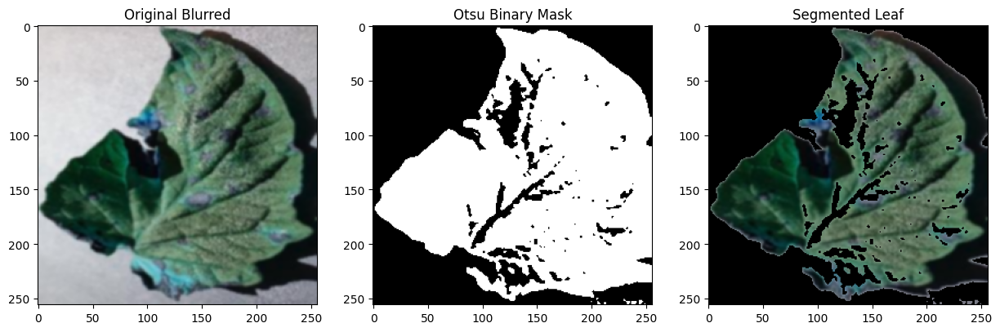

Test sur la classe : Tomato_healthy


<Figure size 640x480 with 0 Axes>

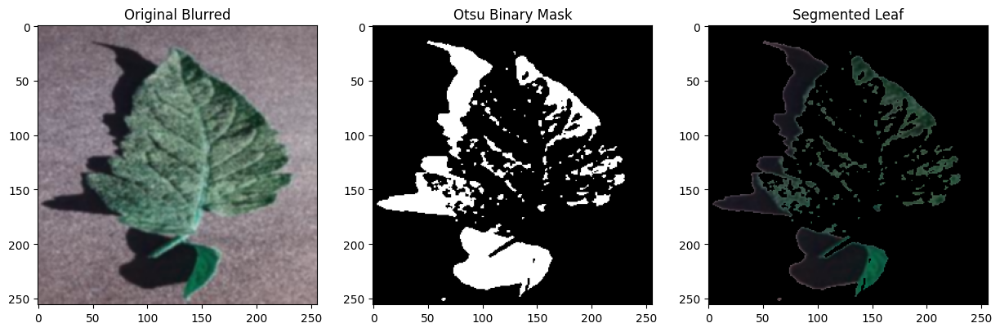

Test sur la classe : Tomato_Late_blight


<Figure size 640x480 with 0 Axes>

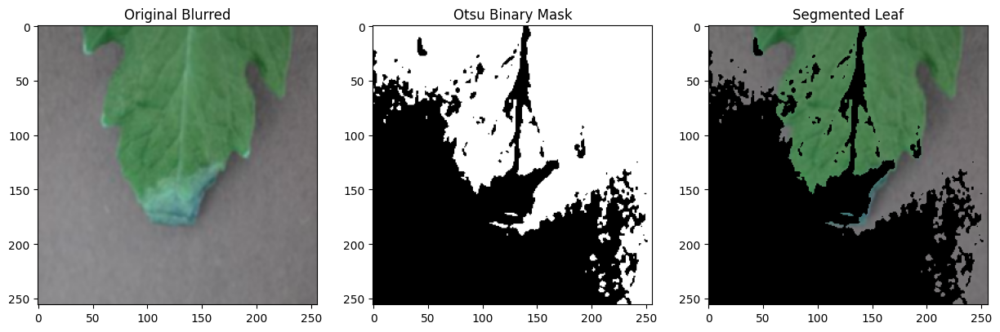

Test sur la classe : Tomato_Leaf_Mold


<Figure size 640x480 with 0 Axes>

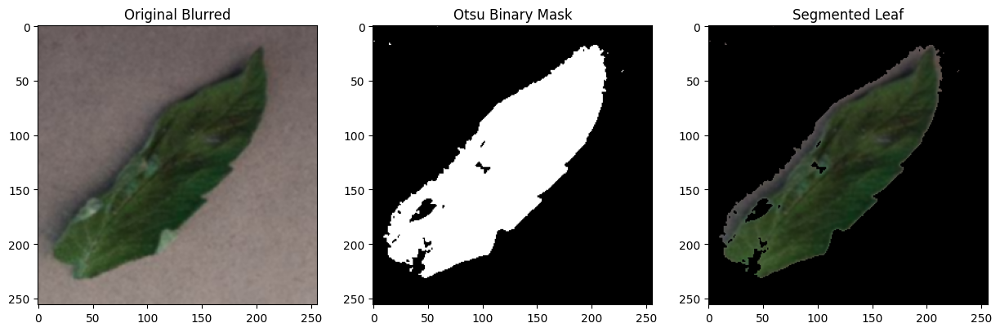

In [5]:

def tester_segment_with_otsu(base_path, categories):
    for cat in categories:
        cat_path = os.path.join(base_path, cat)
        # Prendre la première image du dossier de la classe
        img_name = os.listdir(cat_path)[6]
        full_path = os.path.join(cat_path, img_name)
        
        print(f"Test sur la classe : {cat}")
        
        # Appel de la fonction définie précédemment
        # (Assurez-vous que la fonction pretraitement_image est dans le même notebook)
        img_resized, img_gray, img_hsv, img_blurred = pretraitement_image_pipeline(full_path)
        mask, segmented_leaf = segment_with_otsu(img_blurred, img_gray)
        

tester_segment_with_otsu(DATASET_PATH, classes_choisies)


## Segmentation — Méthode 2 : Masque HSV (couleur verte)

Isole les pixels verts en filtrant dans l'espace HSV (H ∈ [25, 90]).

Avantage : efficace quelle que soit la luminosité de l'image.

In [6]:
def segment_hsv_green(img_blurred, img_hsv):
    """
    Isolates green pixels to separate the leaf from the background using HSV.
    """
    # Define range for green color in HSV
    # Note: These values may need slight tuning depending on the specific lighting
    lower_green = np.array([25, 40, 40])
    upper_green = np.array([90, 255, 255])
    
    # Create the mask
    mask = cv2.inRange(img_hsv, lower_green, upper_green)
    
    # Apply mask to the blurred image
    res = cv2.bitwise_and(img_blurred, img_blurred, mask=mask)
    
    # Visualization
    plt.figure(figsize=(15, 5))
    plt.subplot(1, 3, 1), plt.imshow(img_hsv), plt.title('HSV Image')
    plt.subplot(1, 3, 2), plt.imshow(mask, cmap='gray'), plt.title('Green Mask')
    plt.subplot(1, 3, 3), plt.imshow(cv2.cvtColor(res, cv2.COLOR_BGR2RGB)), plt.title('Color Segmented Result')
    plt.show()
    
    return mask, res

Test sur la classe : Tomato_Early_blight


<Figure size 640x480 with 0 Axes>

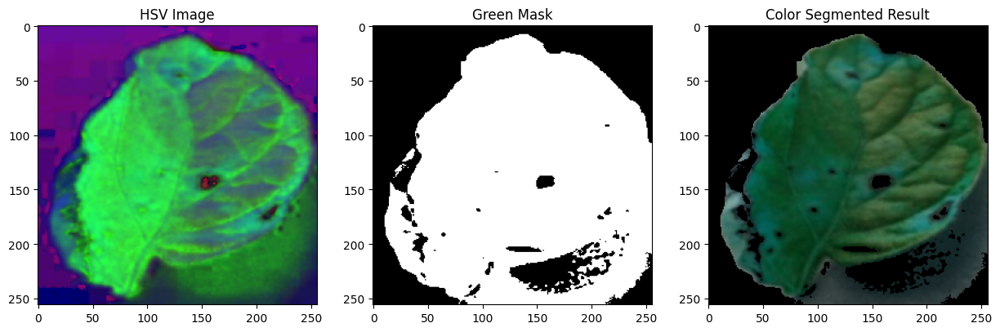

Test sur la classe : Tomato_healthy


<Figure size 640x480 with 0 Axes>

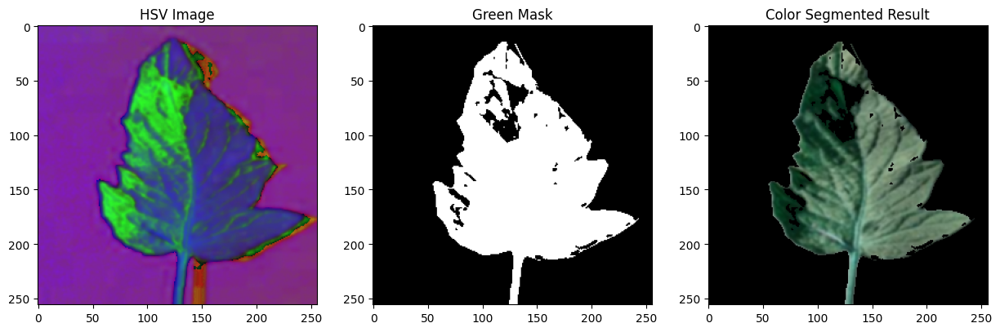

Test sur la classe : Tomato_Late_blight


<Figure size 640x480 with 0 Axes>

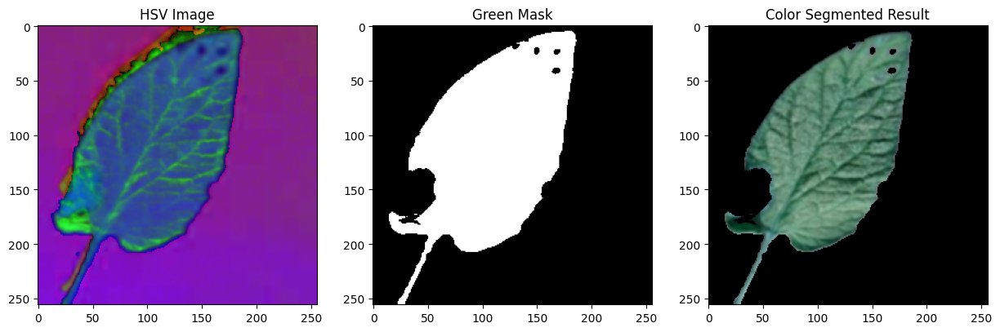

Test sur la classe : Tomato_Leaf_Mold


<Figure size 640x480 with 0 Axes>

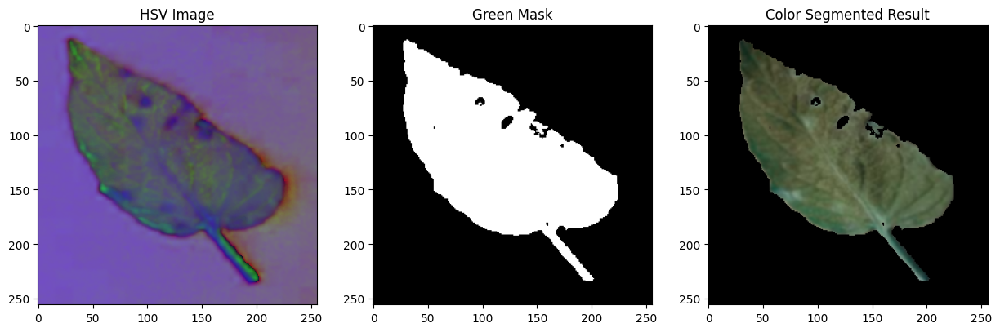

In [7]:

def tester_segment_hsv_green(base_path, categories):
    for cat in categories:
        cat_path = os.path.join(base_path, cat)
        # Prendre la première image du dossier de la classe
        img_name = os.listdir(cat_path)[10]
        full_path = os.path.join(cat_path, img_name)
        
        print(f"Test sur la classe : {cat}")
        
        # Appel de la fonction définie précédemment
        # (Assurez-vous que la fonction pretraitement_image est dans le même notebook)
        img_resized, img_gray, img_hsv, img_blurred = pretraitement_image_pipeline(full_path)
        mask, segmented_leaf = segment_hsv_green(img_blurred, img_hsv)
        

tester_segment_hsv_green(DATASET_PATH, classes_choisies)

## Segmentation — Méthode 3 : K-Means

Regroupe les pixels en **K clusters** (K=3 par défaut). Le cluster le plus lumineux est identifié comme l'arrière-plan et retiré.

Méthode non supervisée : aucun réglage de seuil manuel nécessaire.

In [8]:
def segment_kmeans(img_blurred, k=3):
    """
    Clusters the image into K regions and removes the background cluster.
    """
    # Flatten the image to a 2D array of pixels (N, 3)
    data = img_blurred.reshape((-1, 3))
    data = np.float32(data)
    
    # Define criteria and apply K-Means
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)
    _, labels, centers = cv2.kmeans(data, k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)
    
    # Convert centers back to 8-bit
    centers = np.uint8(centers)
    res = centers[labels.flatten()]
    res_image = res.reshape((img_blurred.shape))
    
    # Identify background (In PlantVillage, background is usually the brightest cluster)
    # We find the cluster with the highest average intensity
    brightness = np.sum(centers, axis=1)
    bg_label = np.argmax(brightness)
    
    # Create a version with background removed
    mask = labels.reshape(img_blurred.shape[:2])
    segmented_no_bg = np.copy(img_blurred)
    segmented_no_bg[mask == bg_label] = [0, 0, 0] # Set background to black
    
    # Visualization
    plt.figure(figsize=(15, 5))
    plt.subplot(1, 2, 1), plt.imshow(cv2.cvtColor(res_image, cv2.COLOR_BGR2RGB)), plt.title('K-Means Clusters')
    plt.subplot(1, 2, 2), plt.imshow(cv2.cvtColor(segmented_no_bg, cv2.COLOR_BGR2RGB)), plt.title('Background Removed')
    plt.show()
    
    return segmented_no_bg, labels

Test sur la classe : Tomato_Early_blight


<Figure size 640x480 with 0 Axes>

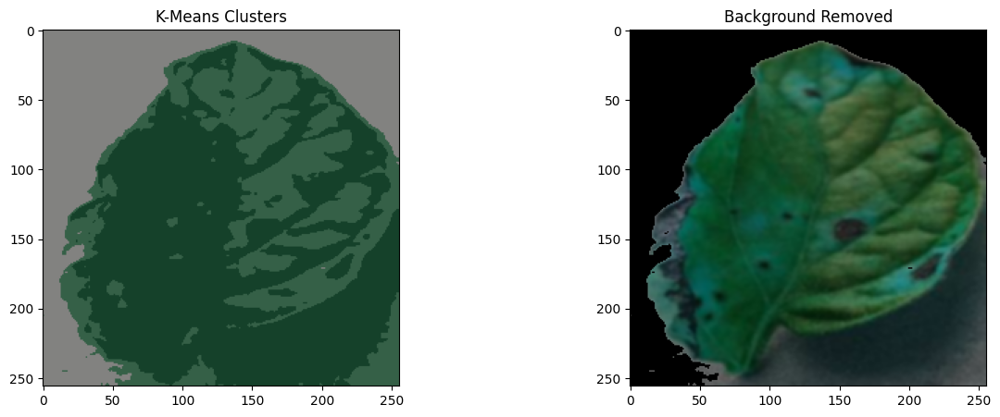

(256, 256, 3) (65536, 1)
Test sur la classe : Tomato_healthy


<Figure size 640x480 with 0 Axes>

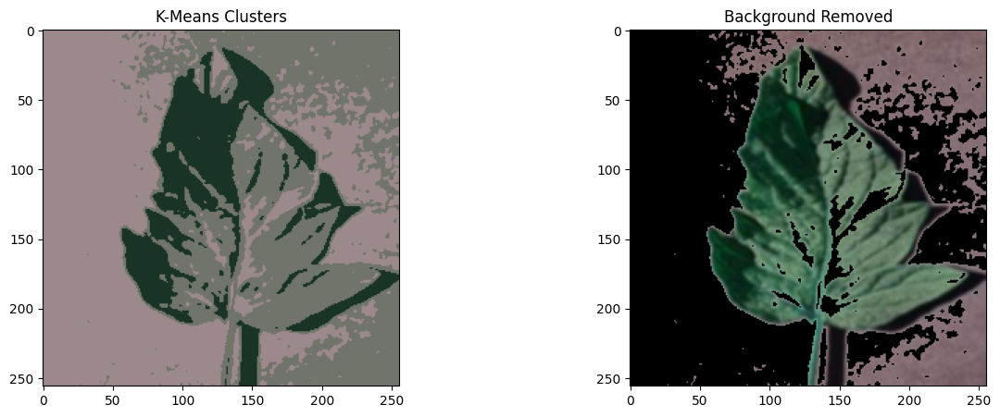

(256, 256, 3) (65536, 1)
Test sur la classe : Tomato_Late_blight


<Figure size 640x480 with 0 Axes>

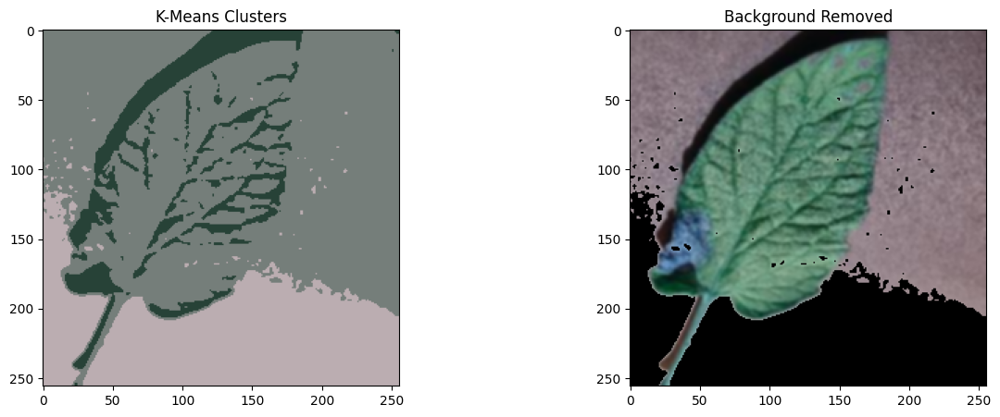

(256, 256, 3) (65536, 1)
Test sur la classe : Tomato_Leaf_Mold


<Figure size 640x480 with 0 Axes>

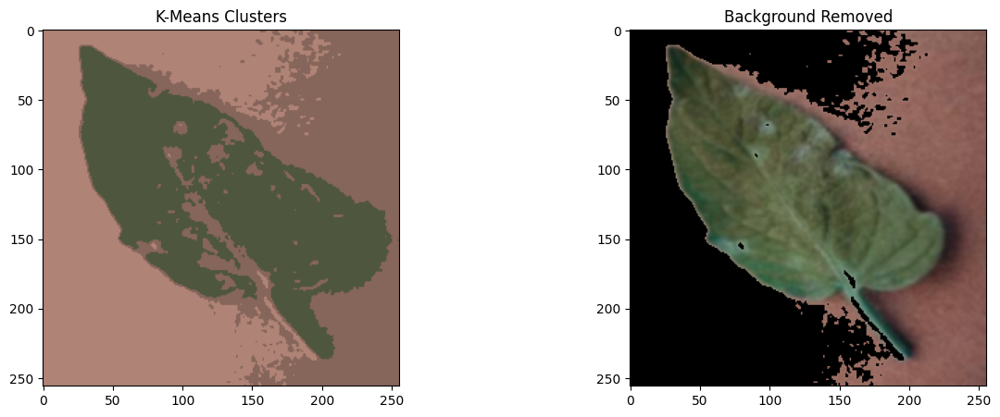

(256, 256, 3) (65536, 1)


In [9]:

def tester_segment_kmeans(base_path, categories):
    for cat in categories:
        cat_path = os.path.join(base_path, cat)
        # Prendre la première image du dossier de la classe
        img_name = os.listdir(cat_path)[10]
        full_path = os.path.join(cat_path, img_name)
        
        print(f"Test sur la classe : {cat}")
        
        # Appel de la fonction définie précédemment
        # (Assurez-vous que la fonction pretraitement_image est dans le même notebook)
        img_resized, img_gray, img_hsv, img_blurred = pretraitement_image_pipeline(full_path)
        mask, segmented_leaf = segment_kmeans(img_blurred, k=3)
        print(mask.shape, segmented_leaf.shape)
        

tester_segment_kmeans(DATASET_PATH, classes_choisies)

### Comparaison visuelle des 3 méthodes de segmentation

Affiche côte à côte les résultats **Otsu**, **HSV** et **K-Means** sur la même image pour comparer qualitativement les trois approches.

Classe testee : Tomato_Early_blight
Image testee  : 0012b9d2-2130-4a06-a834-b1f3af34f57e___RS_Erly.B 8389.JPG


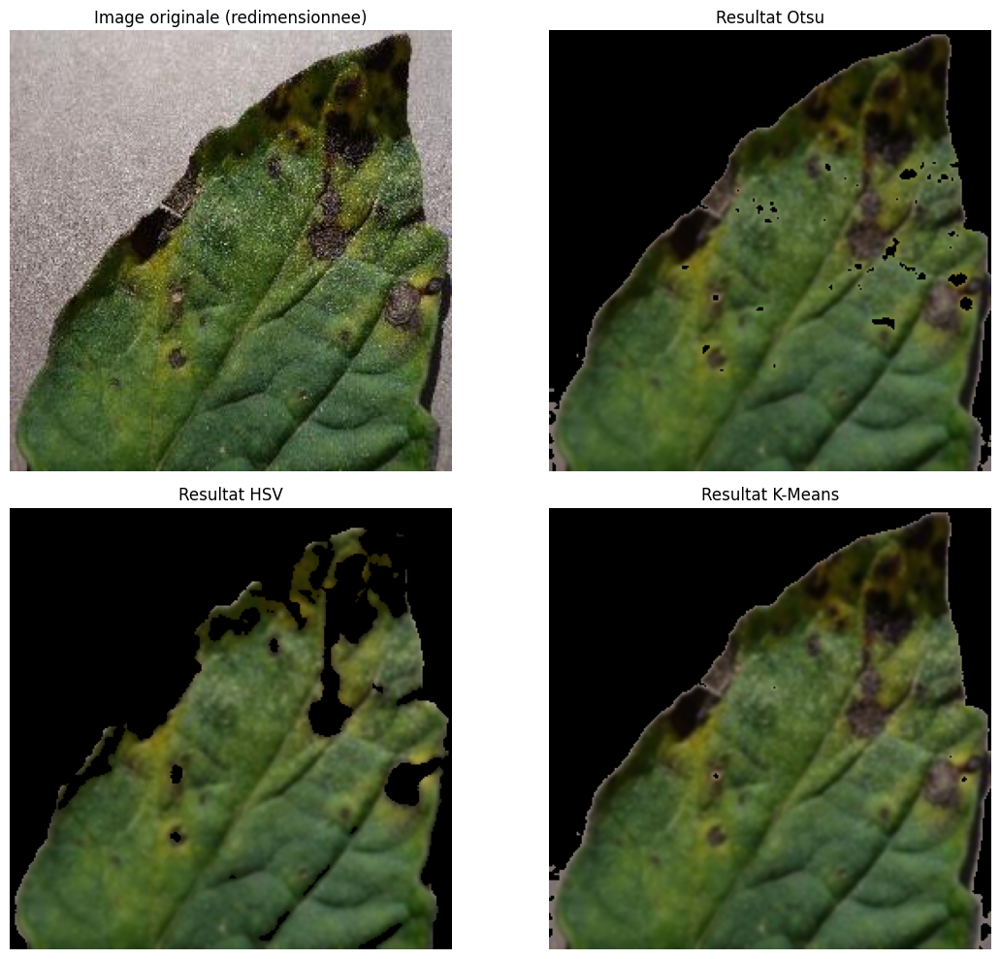

In [24]:
# Comparaison visuelle Otsu / HSV / K-Means sur une image
# Cette cellule reutilise les fonctions deja definies plus haut (aucun re-codage des algorithmes).

def plot_segmentation_comparison(image_path, k=3):
    # On masque temporairement les figures internes des fonctions existantes
    # pour ne garder qu'une seule figure comparative finale.
    old_show = plt.show
    try:
        plt.show = lambda *args, **kwargs: None

        img_resized, img_gray, img_hsv, img_blurred = pretraitement_image_pipeline(image_path, display=False)
        mask_otsu, segmented_otsu = segment_with_otsu(img_blurred, img_gray)
        mask_hsv, segmented_hsv = segment_hsv_green(img_blurred, img_hsv)
        segmented_kmeans, _ = segment_kmeans(img_blurred, k=k)
    finally:
        plt.show = old_show
        plt.close('all')

    fig, axes = plt.subplots(2, 2, figsize=(12, 10))

    axes[0, 0].imshow(img_resized)
    axes[0, 0].set_title('Image originale (redimensionnee)')

    axes[0, 1].imshow(segmented_otsu)
    axes[0, 1].set_title('Resultat Otsu')

    axes[1, 0].imshow(segmented_hsv)
    axes[1, 0].set_title('Resultat HSV')

    axes[1, 1].imshow(segmented_kmeans)
    axes[1, 1].set_title('Resultat K-Means')

    for ax in axes.ravel():
        ax.axis('off')

    plt.tight_layout()
    plt.show()


# Exemple: prend une image de la premiere classe selectionnee
sample_class = classes_choisies[0]
sample_dir = os.path.join(DATASET_PATH, sample_class)
sample_image = next(
    os.path.join(sample_dir, fname)
    for fname in os.listdir(sample_dir)
    if fname.lower().endswith(('.jpg', '.jpeg', '.png'))
)

print(f'Classe testee : {sample_class}')
print(f'Image testee  : {os.path.basename(sample_image)}')
plot_segmentation_comparison(sample_image, k=3)

## 4. Détection de contours — Méthode 1 : Sobel

Calcule les gradients d'intensité horizontaux (Gx) et verticaux (Gy) avec un noyau 3×3.

La magnitude finale est : **√(Gx² + Gy²)**. Les calculs se font en `float64` pour éviter les débordements numériques.

In [10]:
def detect_edges_sobel(img_gray):
    """
    Applies Sobel filter to find edges in X and Y directions.
    """
    # Sobel X and Y (using 64-bit float to prevent overflow)
    sobel_x = cv2.Sobel(img_gray, cv2.CV_64F, 1, 0, ksize=3)
    sobel_y = cv2.Sobel(img_gray, cv2.CV_64F, 0, 1, ksize=3)
    
   
    sobel = cv2.magnitude(sobel_x, sobel_y)
    sobel = np.uint8(np.clip(sobel, 0, 255))
        
    # Visualization
    plt.figure(figsize=(20, 5))
    plt.subplot(1, 4, 1), plt.imshow(img_gray, cmap='gray'), plt.title('Grayscale')
    plt.subplot(1, 4, 2), plt.imshow(np.absolute(sobel_x), cmap='gray'), plt.title('Sobel X')
    plt.subplot(1, 4, 3), plt.imshow(np.absolute(sobel_y), cmap='gray'), plt.title('Sobel Y')
    plt.subplot(1, 4, 4), plt.imshow(sobel, cmap='gray'), plt.title('Gradient Magnitude')
    plt.show()
    
    return sobel

Test sur la classe : Tomato_Early_blight


<Figure size 640x480 with 0 Axes>

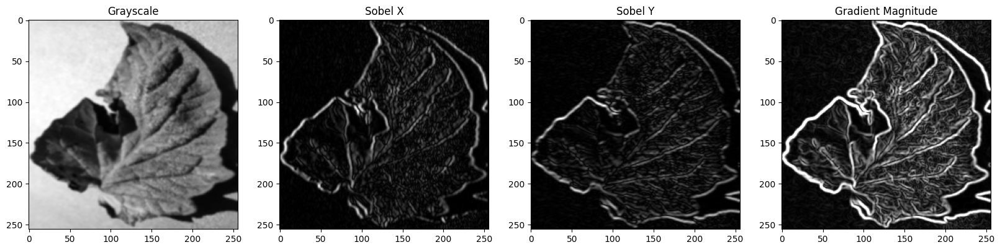

Nombre de pixels d'arêtes détectés : 64677
Test sur la classe : Tomato_healthy


<Figure size 640x480 with 0 Axes>

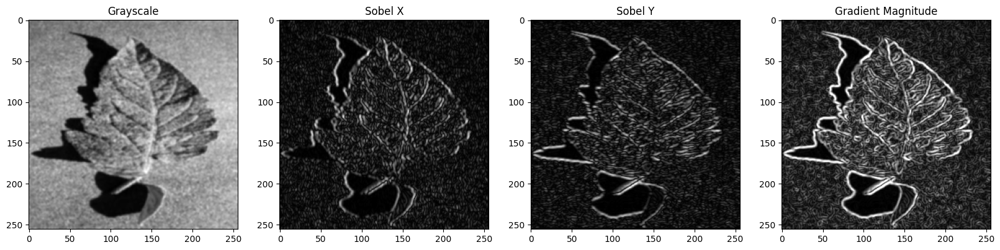

Nombre de pixels d'arêtes détectés : 65274
Test sur la classe : Tomato_Late_blight


<Figure size 640x480 with 0 Axes>

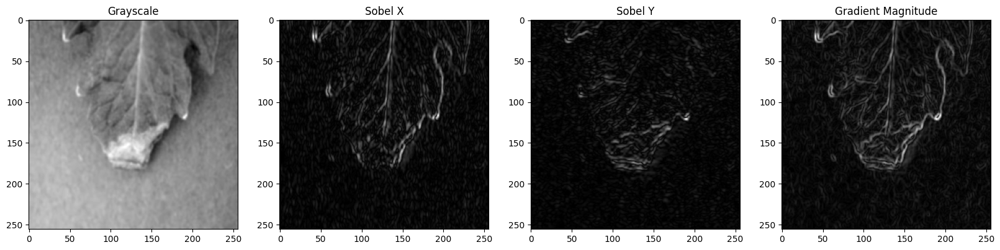

Nombre de pixels d'arêtes détectés : 64691
Test sur la classe : Tomato_Leaf_Mold


<Figure size 640x480 with 0 Axes>

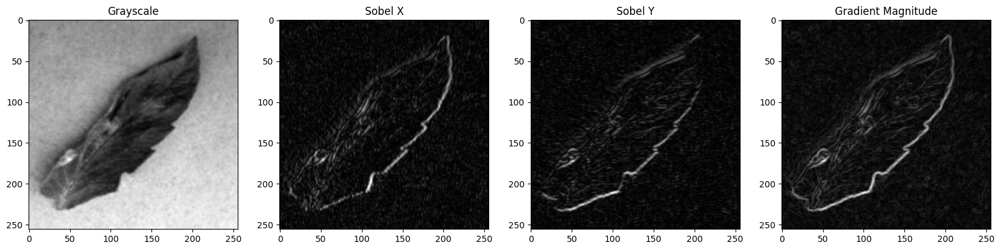

Nombre de pixels d'arêtes détectés : 65293


In [11]:

def tester_sobel(base_path, categories):
    for cat in categories:
        cat_path = os.path.join(base_path, cat)
        # Prendre la première image du dossier de la classe
        img_name = os.listdir(cat_path)[6]
        full_path = os.path.join(cat_path, img_name)
        
        print(f"Test sur la classe : {cat}")
        
        # Appel de la fonction définie précédemment
        # (Assurez-vous que la fonction pretraitement_image est dans le même notebook)
        img_resized, img_gray, img_hsv, img_blurred = pretraitement_image_pipeline(full_path)
        magnitude = detect_edges_sobel(img_gray)
        print(f"Nombre de pixels d'arêtes détectés : {np.sum(magnitude > 0)}")  # Affiche le nombre de pixels d'arêtes détectés

tester_sobel(DATASET_PATH, classes_choisies)

## Détection de contours — Méthode 2 : Canny

Applique l'algorithme de Canny avec deux sensibilités :
- **(50, 150)** : capture plus de détails mais aussi plus de bruit
- **(100, 200)** : seulement les contours forts (version retournée par défaut)

In [12]:
def detect_edges_canny(img_gray):
    """
    Applies Canny edge detection with two different threshold sets.
    """
    # Test two different sensitivity levels
    # Lower thresholds catch more noise; higher thresholds catch only strong edges
    canny_1 = cv2.Canny(img_gray, 50, 150)
    canny_2 = cv2.Canny(img_gray, 100, 200)
    
    # Visualization
    plt.figure(figsize=(15, 5))
    plt.subplot(1, 3, 1), plt.imshow(img_gray, cmap='gray'), plt.title('Original Gray')
    plt.subplot(1, 3, 2), plt.imshow(canny_1, cmap='gray'), plt.title('Canny (50, 150)')
    plt.subplot(1, 3, 3), plt.imshow(canny_2, cmap='gray'), plt.title('Canny (100, 200)')
    plt.show()
    
    # Returning the more refined edges (canny_2)
    return canny_2

Test sur la classe : Tomato_Early_blight


<Figure size 640x480 with 0 Axes>

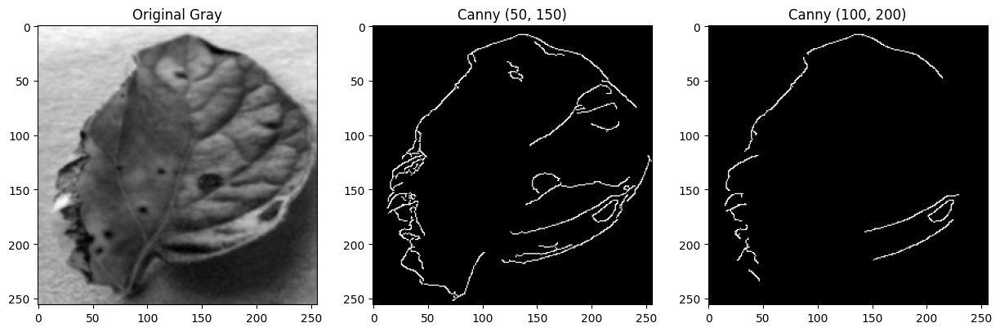

Nombre de pixels d'arêtes détectés : 841
Test sur la classe : Tomato_healthy


<Figure size 640x480 with 0 Axes>

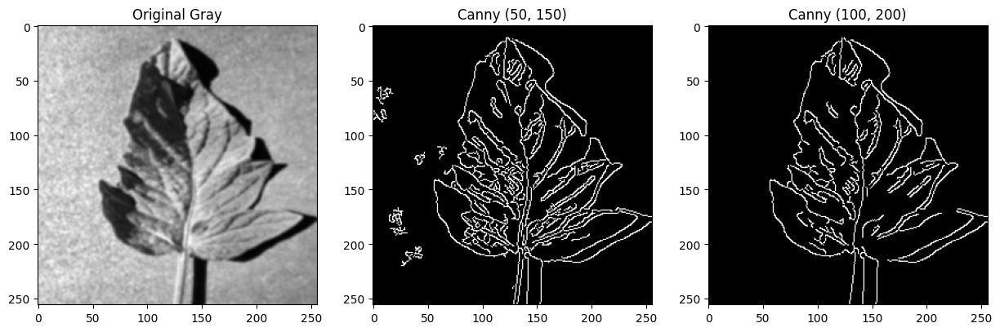

Nombre de pixels d'arêtes détectés : 3581
Test sur la classe : Tomato_Late_blight


<Figure size 640x480 with 0 Axes>

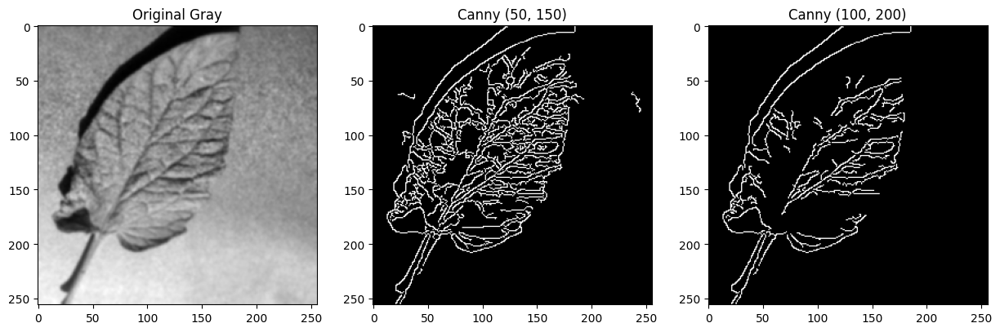

Nombre de pixels d'arêtes détectés : 3123
Test sur la classe : Tomato_Leaf_Mold


<Figure size 640x480 with 0 Axes>

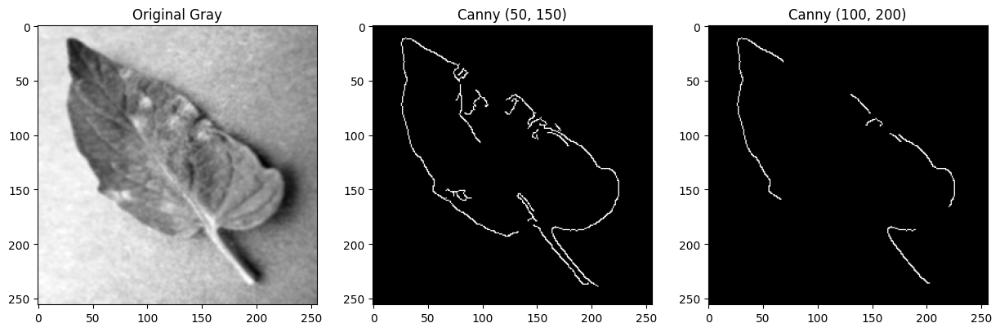

Nombre de pixels d'arêtes détectés : 546


In [13]:

def tester_canny(base_path, categories):
    for cat in categories:
        cat_path = os.path.join(base_path, cat)
        # Prendre la première image du dossier de la classe
        img_name = os.listdir(cat_path)[10]
        full_path = os.path.join(cat_path, img_name)
        
        print(f"Test sur la classe : {cat}")
        
        # Appel de la fonction définie précédemment
        # (Assurez-vous que la fonction pretraitement_image est dans le même notebook)
        img_resized, img_gray, img_hsv, img_blurred = pretraitement_image_pipeline(full_path)
        magnitude = detect_edges_canny(img_gray)
        print(f"Nombre de pixels d'arêtes détectés : {np.sum(magnitude > 0)}")  # Affiche le nombre de pixels d'arêtes détectés

tester_canny(DATASET_PATH, classes_choisies)

### Comparaison visuelle Sobel vs Canny

Affiche en parallèle l'image originale, le résultat **Sobel** et le résultat **Canny** pour comparer les deux méthodes de détection de contours.

Classe testee : Tomato_Early_blight
Image testee  : 0012b9d2-2130-4a06-a834-b1f3af34f57e___RS_Erly.B 8389.JPG


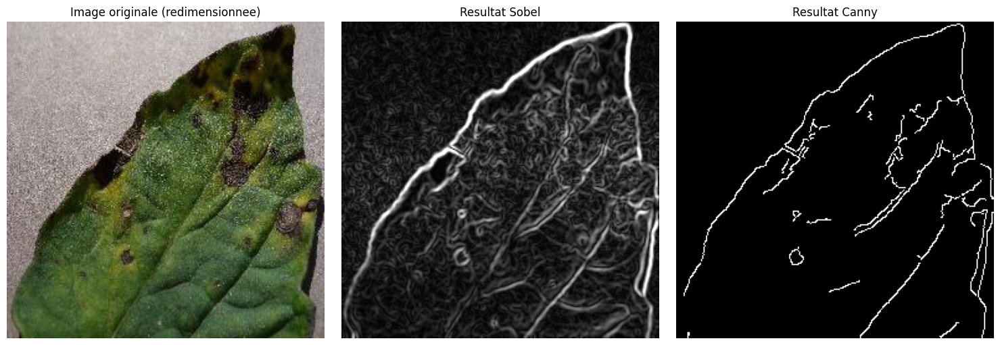

In [25]:
# Comparaison visuelle Sobel / Canny sur une image
# Cette cellule reutilise les fonctions deja definies plus haut (aucun re-codage des algorithmes).

def plot_edge_detection_comparison(image_path):
    # Masquer temporairement les figures internes des fonctions existantes
    # pour afficher une seule figure comparative finale.
    old_show = plt.show
    try:
        plt.show = lambda *args, **kwargs: None

        img_resized, img_gray, img_hsv, img_blurred = pretraitement_image_pipeline(image_path, display=False)
        sobel_edges = detect_edges_sobel(img_gray)
        canny_edges = detect_edges_canny(img_gray)
    finally:
        plt.show = old_show
        plt.close('all')

    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    axes[0].imshow(img_resized)
    axes[0].set_title('Image originale (redimensionnee)')

    axes[1].imshow(sobel_edges, cmap='gray')
    axes[1].set_title('Resultat Sobel')

    axes[2].imshow(canny_edges, cmap='gray')
    axes[2].set_title('Resultat Canny')

    for ax in axes:
        ax.axis('off')

    plt.tight_layout()
    plt.show()


# Exemple: prend une image de la premiere classe selectionnee
sample_class_edges = classes_choisies[0]
sample_dir_edges = os.path.join(DATASET_PATH, sample_class_edges)
sample_image_edges = next(
    os.path.join(sample_dir_edges, fname)
    for fname in os.listdir(sample_dir_edges)
    if fname.lower().endswith(('.jpg', '.jpeg', '.png'))
)

print(f'Classe testee : {sample_class_edges}')
print(f'Image testee  : {os.path.basename(sample_image_edges)}')
plot_edge_detection_comparison(sample_image_edges)

##  5. Extraction de caractéristiques — Histogrammes de couleur

In [14]:
def color_histogram_features(img, bins=32):
    features = []
    # RGB histograms
    for channel in range(3):
        hist = cv2.calcHist([img], [channel], None, [bins], [0, 256])
        features.extend(hist.flatten())
    
    # HSV histograms
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    for channel in range(3):
        hist = cv2.calcHist([hsv], [channel], None, [bins], [0, 256])
        features.extend(hist.flatten())
    
    return np.array(features)  # vector of size 6 * 32 = 192

In [15]:
from skimage.feature import graycomatrix, graycoprops

def glcm_features(img):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    gray = (gray // 32).astype(np.uint8)  # reduce to 8 gray levels for speed
    
    # distances=[1], angles=[0°, 45°, 90°, 135°]
    glcm = graycomatrix(gray, distances=[1], 
                        angles=[0, np.pi/4, np.pi/2, 3*np.pi/4],
                        levels=8, symmetric=True, normed=True)
    
    features = []
    for prop in ['contrast', 'dissimilarity', 'homogeneity', 'energy', 'correlation']:
        values = graycoprops(glcm, prop).flatten()  # 4 values per property
        features.extend(values)
    
    return np.array(features)  # vector of size 5 * 4 = 20

In [16]:
def shape_features(img):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    _, binary = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    
    contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    if not contours:
        return np.zeros(3)
    
    cnt = max(contours, key=cv2.contourArea)  # largest contour = the leaf
    
    area      = cv2.contourArea(cnt)
    perimeter = cv2.arcLength(cnt, True)
    
    # Circularity: 1.0 = perfect circle
    circularity = (4 * np.pi * area / (perimeter ** 2)) if perimeter > 0 else 0
    
    return np.array([area, perimeter, circularity])

### Construction du dataset complet — 215 features par image

Combine les 3 types de features : **192** (couleur) + **20** (texture) + **3** (forme) = **215 features**.

Parcourt toutes les images du dataset pour construire les matrices `X` (features) et `y` (labels).

In [17]:
def extract_all_features(img_path):
    img = cv2.imread(img_path)
    img = cv2.resize(img, (128, 128))
    
    color   = color_histogram_features(img)   # 192 features
    texture = glcm_features(img)              #  20 features
    shape   = shape_features(img)             #   3 features
    
    return np.concatenate([color, texture, shape])  # → 215 features total

# Build dataset
import os

X, y = [], []
for cat in classes_choisies:
    cat_path = os.path.join(DATASET_PATH, cat)
    # Prendre la première image du dossier de la classe
    
    for img_name in os.listdir(cat_path):
        full_path = os.path.join(cat_path, img_name)
        
        # Skip non-image files
        if not img_name.lower().endswith(('.jpg', '.jpeg', '.png')):
            continue
        
        features = extract_all_features(full_path)
        X.append(features)
        y.append(cat)

X = np.array(X)
y = np.array(y)

## 6. Classification Machine Learning — Random Forest

Entraîne un **Random Forest** (100 arbres) sur les 215 features extraites.

**Pipeline :**
1. Encodage des labels (LabelEncoder)
2. Split 80% / 20% stratifié
3. Entraînement
4. Prédiction
5. Évaluation : Accuracy, Précision, Rappel + rapport de classification complet + matrice de confusion

Train: (4361, 215), Test: (1091, 215)
Accuracy  : 0.9624
Precision : 0.9629
Recall    : 0.9624

Classification Report:
                     precision    recall  f1-score   support

Tomato_Early_blight       0.96      0.93      0.94       200
 Tomato_Late_blight       0.93      0.97      0.95       382
   Tomato_Leaf_Mold       0.96      0.94      0.95       191
     Tomato_healthy       1.00      0.99      0.99       318

           accuracy                           0.96      1091
          macro avg       0.96      0.96      0.96      1091
       weighted avg       0.96      0.96      0.96      1091



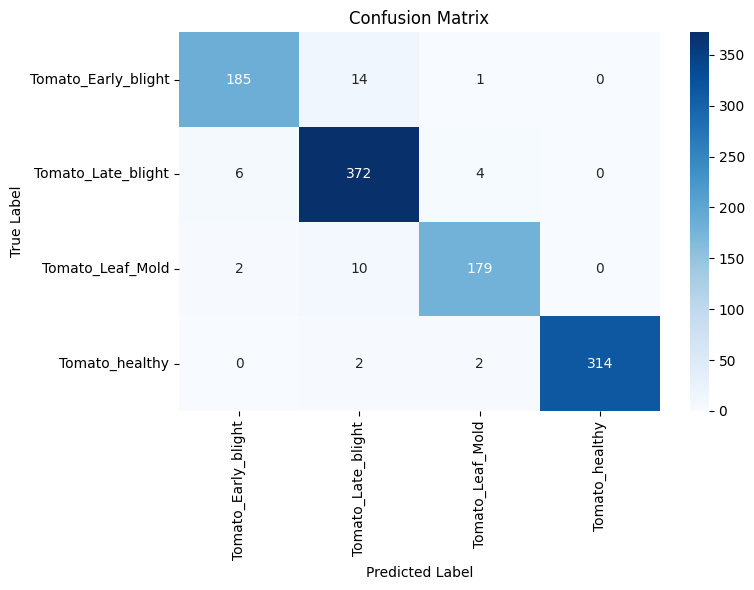

In [18]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, precision_score, recall_score, classification_report, confusion_matrix
import seaborn as sns

# 1. Encode labels
le = LabelEncoder()
y_encoded = le.fit_transform(y)

# 2. Split
X_train, X_test, y_train, y_test = train_test_split(
    X, y_encoded, test_size=0.2, random_state=42, stratify=y_encoded
)
print(f"Train: {X_train.shape}, Test: {X_test.shape}")

# 3. Train
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# 4. Predict
y_pred = model.predict(X_test)

# 5. Evaluate
print(f"Accuracy  : {accuracy_score(y_test, y_pred):.4f}")
print(f"Precision : {precision_score(y_test, y_pred, average='weighted'):.4f}")
print(f"Recall    : {recall_score(y_test, y_pred, average='weighted'):.4f}")

print("\nClassification Report:")
print(classification_report(y_test, y_pred, target_names=le.classes_))

# 6. Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=le.classes_, yticklabels=le.classes_)
plt.title("Confusion Matrix")
plt.ylabel("True Label")
plt.xlabel("Predicted Label")
plt.tight_layout()
plt.show()

##  7. Transfer Learning — Chargement des images (MobileNetV2)

Recharge les images depuis le disque redimensionnées à **224×224 px** (taille requise par MobileNetV2).

Normalisation dans [-1, 1] via `preprocess_input()` de Keras.

In [20]:
# ── Cellule 1 : Chargement des images pour le Transfer Learning ───────────────
# On recharge les images directement depuis le disque (224x224 pour MobileNetV2)
# On réutilise DATASET_PATH et classes_choisies déjà définis plus haut.

# Before (triggers Pylance warning)
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.utils import to_categorical

IMG_SIZE = (224, 224)

X_img, y_img = [], []
for label_idx, cat in enumerate(classes_choisies):
    cat_path = os.path.join(DATASET_PATH, cat)
    for img_name in os.listdir(cat_path):
        if not img_name.lower().endswith(('.jpg', '.jpeg', '.png')):
            continue
        img = cv2.imread(os.path.join(cat_path, img_name))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, IMG_SIZE)
        X_img.append(img)
        y_img.append(label_idx)

X_img = preprocess_input(np.array(X_img, dtype='float32'))  # normalise pour MobileNetV2
y_img = np.array(y_img)

# Train/test split (même ratio 80/20 que votre ML)
from sklearn.model_selection import train_test_split
X_tr, X_te, y_tr, y_te = train_test_split(X_img, y_img, test_size=0.2, random_state=42, stratify=y_img)

num_classes = len(classes_choisies)
y_tr_cat = to_categorical(y_tr, num_classes)
y_te_cat = to_categorical(y_te, num_classes)

print(f'Train: {X_tr.shape}, Test: {X_te.shape}')

Train: (4361, 224, 224, 3), Test: (1091, 224, 224, 3)


### Construction et entraînement du modèle MobileNetV2

**Architecture :**
- Base : MobileNetV2 pré-entraîné sur ImageNet (couches gelées)
- Tête : GlobalAveragePooling2D → Dense(128, relu) → Dropout(0.3) → Dense(N_classes, softmax)

**Phase 1 :** Feature extraction — seule la tête est entraînée (10 epochs, EarlyStopping patience=3).

In [22]:
# ── Cellule 2 : Construction et entraînement du modèle ───────────────────────

from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras import layers, Model, optimizers
import tensorflow as tf
# Base pré-entraînée sur ImageNet, tête retirée
base = MobileNetV2(input_shape=(224, 224, 3), include_top=False, weights='imagenet')
base.trainable = False  # Phase 1 : on gèle tout

# Tête personnalisée
x = layers.GlobalAveragePooling2D()(base.output)
x = layers.Dense(128, activation='relu')(x)
x = layers.Dropout(0.3)(x)
out = layers.Dense(num_classes, activation='softmax')(x)

model_tl = Model(base.input, out)
model_tl.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Phase 1 : feature extraction (base gelée)
print('=== Phase 1 : Feature Extraction ===')
history_tl = model_tl.fit(
    X_tr, y_tr_cat,
    epochs=10,
    batch_size=32,
    validation_split=0.15,
    callbacks=[tf.keras.callbacks.EarlyStopping(patience=3, restore_best_weights=True)]
)

# Phase 2 : fine-tuning (dégel des 20 dernières couches)
print('\n=== Phase 2 : Fine-Tuning ===')
base.trainable = True
for layer in base.layers[:-20]:
    layer.trainable = False

model_tl.compile(optimizer=optimizers.Adam(1e-5), loss='categorical_crossentropy', metrics=['accuracy'])
history_ft = model_tl.fit(
    X_tr, y_tr_cat,
    epochs=10,
    batch_size=32,
    validation_split=0.15,
    callbacks=[tf.keras.callbacks.EarlyStopping(patience=3, restore_best_weights=True)]
)

=== Phase 1 : Feature Extraction ===
Epoch 1/10
116/116 ━━━━━━━━━━━━━━━━━━━━ 33s 259ms/step - accuracy: 0.8216 - loss: 0.4484 - val_accuracy: 0.9298 - val_loss: 0.2061
Epoch 2/10
116/116 ━━━━━━━━━━━━━━━━━━━━ 61s 532ms/step - accuracy: 0.9290 - loss: 0.2008 - val_accuracy: 0.9298 - val_loss: 0.1776
Epoch 3/10
116/116 ━━━━━━━━━━━━━━━━━━━━ 40s 344ms/step - accuracy: 0.9487 - loss: 0.1550 - val_accuracy: 0.9466 - val_loss: 0.1400
Epoch 4/10
116/116 ━━━━━━━━━━━━━━━━━━━━ 29s 252ms/step - accuracy: 0.9601 - loss: 0.1219 - val_accuracy: 0.9542 - val_loss: 0.1256
Epoch 5/10
116/116 ━━━━━━━━━━━━━━━━━━━━ 49s 423ms/step - accuracy: 0.9625 - loss: 0.1028 - val_accuracy: 0.9359 - val_loss: 0.1448
Epoch 6/10
116/116 ━━━━━━━━━━━━━━━━━━━━ 71s 325ms/step - accuracy: 0.9776 - loss: 0.0725 - val_accuracy: 0.9298 - val_loss: 0.1767
Epoch 7/10
116/116 ━━━━━━━━━━━━━━━━━━━━ 29s 250ms/step - accuracy: 0.9808 - loss: 0.0676 - val_accuracy: 0.9496 - val_loss: 0.1269

=== Phase 2 : Fine-Tuning ===
Epoch 1/10
116/

### 📊 Évaluation et comparaison ML vs Deep Learning

Calcule **Accuracy, Précision, Rappel, F1-score** pour le Transfer Learning.

Affiche la matrice de confusion (heatmap Seaborn) pour visualiser les erreurs par classe.

Permet de comparer directement les performances **Random Forest** vs **MobileNetV2**.

35/35 ━━━━━━━━━━━━━━━━━━━━ 9s 230ms/step
=== Transfer Learning (MobileNetV2) ===
Accuracy  : 0.9560
Precision : 0.9572
Recall    : 0.9560
F1-score  : 0.9561


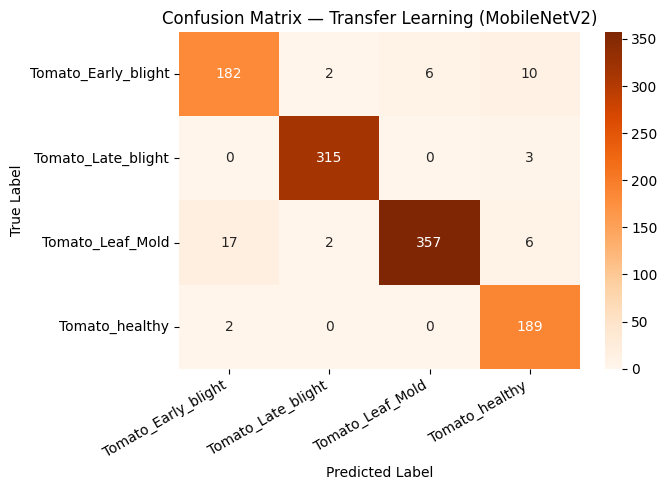


=== Comparaison ML vs Transfer Learning ===
 Métrique ML (Random Forest) DL (MobileNetV2)
 Accuracy             0.9624           0.9560
Precision             0.9629           0.9572
   Recall             0.9624           0.9560
 F1-score                  —           0.9561


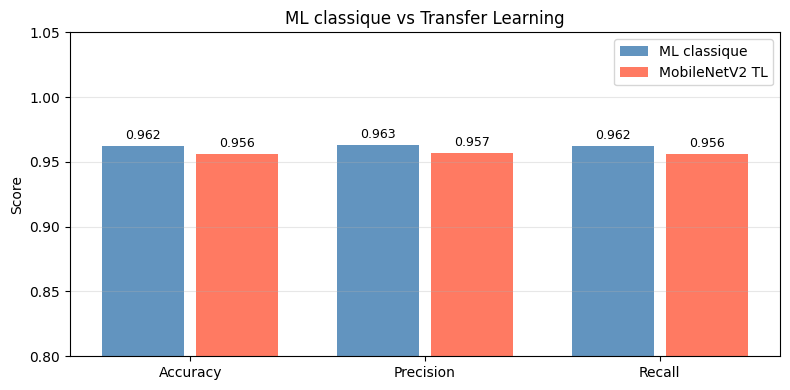

In [23]:
# ── Cellule 3 : Évaluation + Comparaison ML vs DL ────────────────────────────

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

y_pred_tl = np.argmax(model_tl.predict(X_te), axis=1)

tl_acc  = accuracy_score(y_te, y_pred_tl)
tl_prec = precision_score(y_te, y_pred_tl, average='weighted')
tl_rec  = recall_score(y_te, y_pred_tl, average='weighted')
tl_f1   = f1_score(y_te, y_pred_tl, average='weighted')

print('=== Transfer Learning (MobileNetV2) ===')
print(f'Accuracy  : {tl_acc:.4f}')
print(f'Precision : {tl_prec:.4f}')
print(f'Recall    : {tl_rec:.4f}')
print(f'F1-score  : {tl_f1:.4f}')

# ── Matrice de confusion ──────────────────────────────────────────────────────
cm_tl = confusion_matrix(y_te, y_pred_tl)
plt.figure(figsize=(7, 5))
sns.heatmap(cm_tl, annot=True, fmt='d', cmap='Oranges',
            xticklabels=le.classes_, yticklabels=le.classes_)
plt.title('Confusion Matrix — Transfer Learning (MobileNetV2)')
plt.ylabel('True Label'); plt.xlabel('Predicted Label')
plt.xticks(rotation=30, ha='right')
plt.tight_layout(); plt.show()

# ── Tableau comparatif ML vs DL ───────────────────────────────────────────────
# Remplacez les valeurs ml_* par celles obtenues dans votre cellule ML
ml_acc, ml_prec, ml_rec = 0.9624, 0.9629, 0.9624   # ← vos vraies valeurs

import pandas as pd
df_cmp = pd.DataFrame({
    'Métrique'        : ['Accuracy', 'Precision', 'Recall', 'F1-score'],
    'ML (Random Forest)': [f'{ml_acc:.4f}', f'{ml_prec:.4f}', f'{ml_rec:.4f}', '—'],
    'DL (MobileNetV2)'  : [f'{tl_acc:.4f}', f'{tl_prec:.4f}', f'{tl_rec:.4f}', f'{tl_f1:.4f}']
})
print('\n=== Comparaison ML vs Transfer Learning ===')
print(df_cmp.to_string(index=False))

# ── Graphique comparatif ──────────────────────────────────────────────────────
metrics = ['Accuracy', 'Precision', 'Recall']
ml_vals = [ml_acc, ml_prec, ml_rec]
tl_vals = [tl_acc, tl_prec, tl_rec]

x = np.arange(len(metrics))
fig, ax = plt.subplots(figsize=(8, 4))
ax.bar(x - 0.2, ml_vals, 0.35, label='ML classique',   color='steelblue', alpha=0.85)
ax.bar(x + 0.2, tl_vals, 0.35, label='MobileNetV2 TL', color='tomato',    alpha=0.85)
ax.set_ylim(0.8, 1.05)
ax.set_xticks(x); ax.set_xticklabels(metrics)
ax.set_ylabel('Score'); ax.legend(); ax.grid(axis='y', alpha=0.3)
ax.set_title('ML classique vs Transfer Learning')
for bars, vals in [(ax.containers[0], ml_vals), (ax.containers[1], tl_vals)]:
    for bar, v in zip(bars, vals):
        ax.text(bar.get_x() + bar.get_width()/2, v + 0.003, f'{v:.3f}',
                ha='center', va='bottom', fontsize=9)
plt.tight_layout(); plt.show()